In [1]:
from functions import *

In [2]:
from urllib import request
import pandas as pd
import numpy as np
import scipy.stats as st
import matplotlib.pyplot as plt
import seaborn as sns
import re
from sklearn import decomposition
from sklearn import preprocessing
sns.set()


In [3]:
df = pd.read_csv("P3_02_nettoyé_fr.openfoodfacts.org.products.csv", sep = ',', low_memory=False )

# *         la démarche méthodologique d’analyse de données          *

# ACP¶

In [4]:
# choix du nombre de composantes à calculer
n_comp = 6

In [5]:
print('Jeu de données nettoyées')
df

Jeu de données nettoyées


,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,PP,PPa,PPb,PN,PNa,PNb,PNc,PNd,SCORE,New_Nutri
0,0000000004530,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),none,none,...,7,5,2,19,6,3,10,0,12,none
1,0000000016087,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055731,2017-03-09T10:35:31Z,1489055731,2017-03-09T10:35:31Z,Organic Salted Nut Mix,none,none,...,10,5,5,12,7,0,5,0,2,none
2,0000000016100,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055651,2017-03-09T10:34:11Z,1489055651,2017-03-09T10:34:11Z,Breadshop Honey Gone Nuts Granola,none,none,...,10,5,5,8,5,2,1,0,-2,a
3,0000000016193,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055651,2017-03-09T10:34:11Z,1489055651,2017-03-09T10:34:11Z,Organic Dark Chocolate Minis,none,none,...,8,5,3,26,7,9,10,0,18,d
4,0000000016612,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055731,2017-03-09T10:35:31Z,1489055731,2017-03-09T10:35:31Z,Organic Adzuki Beans,none,none,...,10,5,5,4,4,0,0,0,-6,a
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
217940,9948282780603,http://world-fr.openfoodfacts.org/produit/9948...,openfoodfacts-contributors,1490631299,2017-03-27T16:14:59Z,1491244498,2017-04-03T18:34:58Z,Tomato & ricotta,none,1,...,0,0,0,0,0,0,0,0,0,b
217941,99567453,http://world-fr.openfoodfacts.org/produit/9956...,usda-ndb-import,1489059076,2017-03-09T11:31:16Z,1491244499,2017-04-03T18:34:59Z,"Mint Melange Tea A Blend Of Peppermint, Lemon ...",none,none,...,0,0,0,0,0,0,0,0,0,none
217942,9970229501521,http://world-fr.openfoodfacts.org/produit/9970...,tomato,1422099377,2015-01-24T11:36:17Z,1491244499,2017-04-03T18:34:59Z,乐吧泡菜味薯片,Leba pickle flavor potato chips,50 g,...,0,0,0,0,0,0,0,0,0,b
217943,9980282863788,http://world-fr.openfoodfacts.org/produit/9980...,openfoodfacts-contributors,1492340089,2017-04-16T10:54:49Z,1492340089,2017-04-16T10:54:49Z,Tomates aux Vermicelles,none,67g,...,0,0,0,0,0,0,0,0,0,b


In [6]:
# selection des colonnes à prendre en compte dans l'ACP
data_pca = df[["energy_100g","fat_100g","saturated-fat_100g","cholesterol_100g","sugars_100g","fiber_100g","proteins_100g"]]

In [7]:
print('Tableau data PCA')
X = data_pca.values
X

Tableau data PCA


array([[2.243e+03, 2.857e+01, 2.857e+01, ..., 1.429e+01, 3.600e+00,
        3.570e+00],
       [2.540e+03, 5.714e+01, 5.360e+00, ..., 3.570e+00, 7.100e+00,
        1.786e+01],
       [1.933e+03, 1.827e+01, 1.920e+00, ..., 1.154e+01, 7.700e+00,
        1.346e+01],
       ...,
       [0.000e+00, 0.000e+00, 0.000e+00, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       [0.000e+00, 0.000e+00, 0.000e+00, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       [2.092e+03, 0.000e+00, 0.000e+00, ..., 0.000e+00, 0.000e+00,
        0.000e+00]])

In [8]:
# Centrage et Réduction
#std_scale = preprocessing.StandardScaler().fit(X)
X_scaled = preprocessing.StandardScaler().fit_transform(X)

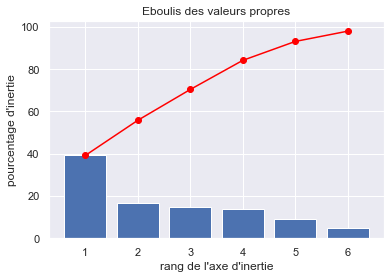

--------------------
Sur F1:
   sugars_100g : -0.24
   saturated-fat_100g : -0.45
   energy_100g : -0.55
   fat_100g : -0.5
   cholesterol_100g : -0.05
   fiber_100g : -0.25
   proteins_100g : -0.3
Corrélation élevée entre les variables energy_100g, saturated-fat_100g, fat_100g sur F1 .
--------------------
Sur F2:
   sugars_100g : 0.75
   saturated-fat_100g : 0.12
   energy_100g : 0.13
   fat_100g : -0.1
   cholesterol_100g : -0.05
   fiber_100g : -0.28
   proteins_100g : -0.57
Corrélation élevée entre les variables fiber_100g , proteins_100g , cholesterol_100g sur F2.
On observe que cholesterol_100g est une variable peux représentative.
--------------------
Sur F3:
   sugars_100g : -0.20
   saturated-fat_100g : 0.25
   energy_100g : -0.05
   fat_100g : 0.15
   cholesterol_100g : 0.75
   fiber_100g : -0.52
   proteins_100g : -0.02
Corrélation élevée entre les variables energy_100g, fiber_100g sur F3 .
On observe que energy_100g , fiber_100g  sont des variables peux représentatives.
--

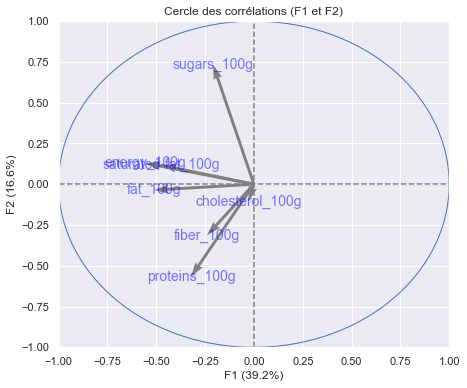

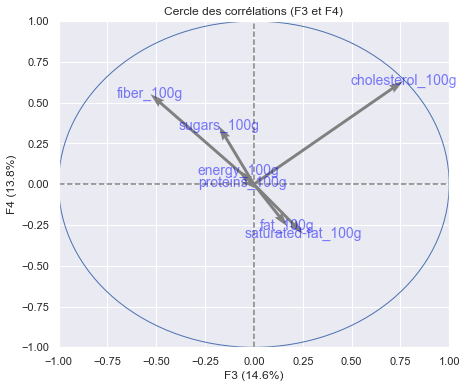

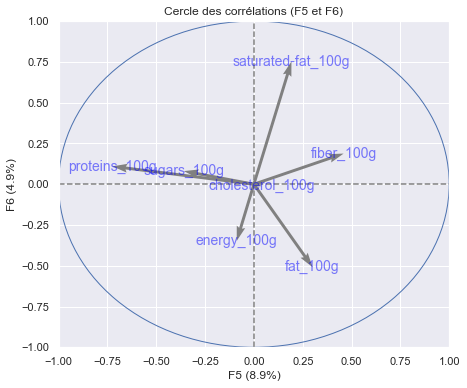

In [9]:
import pandas as pd
from sklearn import decomposition, preprocessing
from functions import *


# choix du nombre de composantes à calculer
n_comp = 6

# import de l'échantillon
#data = pd.read_csv("fr.openfoodfacts.org.products.csv", sep = '\t', low_memory=False)
#X = df.values

# préparation des données pour l'ACP
#data_pca = data_pca.fillna(data_pca.mean()) # Il est fréquent de remplacer les valeurs inconnues par la moyenne de la variable
#X = data_pca.values
names = df["energy_100g"] # ou data.index pour avoir les intitulés
features =  data_pca.columns
#features = df.columns

# Centrage et Réduction
std_scale = preprocessing.StandardScaler().fit(X)
X_scaled = std_scale.transform(X)

# Réduire n'est ici pas nécessaire car les variables sont exprimées dans la même unité. 
# On se contente juste de centrer les données, ce qui est obligatoire pour une ACP.
X = preprocessing.StandardScaler(with_std=False).fit_transform(X)

# Calcul des composantes principales
pca = decomposition.PCA(n_components=n_comp)
pca.fit(X_scaled)

# Eboulis des valeurs propres
display_scree_plot(pca)

# Cercle des corrélations
print("-"*20)
print('Sur F1:')
print('   sugars_100g : -0.24')
print('   saturated-fat_100g : -0.45')
print('   energy_100g : -0.55')
print('   fat_100g : -0.5')
print('   cholesterol_100g : -0.05')
print('   fiber_100g : -0.25')
print('   proteins_100g : -0.3')
print('Corrélation élevée entre les variables energy_100g, saturated-fat_100g, fat_100g sur F1 .')
print("-"*20)
print('Sur F2:')
print('   sugars_100g : 0.75')
print('   saturated-fat_100g : 0.12')
print('   energy_100g : 0.13')
print('   fat_100g : -0.1')
print('   cholesterol_100g : -0.05')
print('   fiber_100g : -0.28')
print('   proteins_100g : -0.57')
print('Corrélation élevée entre les variables fiber_100g , proteins_100g , cholesterol_100g sur F2.') 
print('On observe que cholesterol_100g est une variable peux représentative.')
print("-"*20)
print('Sur F3:')
print('   sugars_100g : -0.20')
print('   saturated-fat_100g : 0.25')
print('   energy_100g : -0.05')
print('   fat_100g : 0.15')
print('   cholesterol_100g : 0.75')
print('   fiber_100g : -0.52')
print('   proteins_100g : -0.02')
print('Corrélation élevée entre les variables energy_100g, fiber_100g sur F3 .')
print('On observe que energy_100g , fiber_100g  sont des variables peux représentatives.')
print("-"*20)
print('Sur F4:')
print('   sugars_100g : 0.60')
print('   saturated-fat_100g : -0.27')
print('   energy_100g : 0.05')
print('   fat_100g : -0.25')
print('   cholesterol_100g : 0.65')
print('   fiber_100g : 0.55')
print('   proteins_100g : -0.07')
print('Corrélation élevée entre les variables sugars_100g, fiber_100g sur F4 .')
print('Corrélation élevée entre les variables fat_100g , saturated-fat_100g sur F4 .')
print('Aucune corrélation entre les variables sugars_100g, cholesterol_100g les deux flèches sont perpendiculaires.')  
print('Aucune corrélation entre les variables fat_100g , cholesterol_100g les deux flèches sont perpendiculaires.')  
print("-"*20)
print('Sur F5:')
print('   sugars_100g : -0.33')
print('   saturated-fat_100g : 0.17')
print('   energy_100g : -0.05')
print('   fat_100g : 0.28')
print('   cholesterol_100g : 0.0')
print('   fiber_100g : 0.45')
print('   proteins_100g : -0.75')
print('Corrélation élevée entre les variables proteins_100g , sugars_100g , cholesterol_100g sur F5 .')  
print('On observe que cholesterol_100g est une variable peux représentative.')
print("-"*20)
print('Sur F6:')
print('   sugars_100g: 0.13')
print('   saturated-fat_100g : 0.75')
print('   energy_100g: 0.05')
print('   fat_100g: -0.50')
print('   cholesterol_100g: 0.65')
print('   fiber_100g: 0.0')
print('   proteins_100g: -0.75')
print('Corrélation faible entre les variables energy_100g , fat_100g sur F6 .')
print('Corrélation faible entre les variables saturated-fat_100g , fiber_100g sur F6 .')
print('Aucune corrélation entre les variables saturated-fat_100g , proteins_100g les deux flèches sont perpendiculaires.')  
print('Aucune corrélation entre les variables saturated-fat_100g , sugars_100g les deux flèches sont perpendiculaires.')

pcs = pca.components_
display_circles(pcs, n_comp, pca, [(0,1),(2,3),(4,5)], labels = np.array(features))


plt.show()

In [10]:
# selection des colonnes à prendre en compte dans l'ACP
data_pca1 = df[["energy_100g","fat_100g","sodium_100g","sugars_100g","fiber_100g","proteins_100g","SCORE"]]

In [11]:
print('Tableau data PCA')
X = data_pca1.values
X

Tableau data PCA


array([[ 2.243e+03,  2.857e+01,  0.000e+00, ...,  3.600e+00,  3.570e+00,
         1.200e+01],
       [ 2.540e+03,  5.714e+01,  4.820e-01, ...,  7.100e+00,  1.786e+01,
         2.000e+00],
       [ 1.933e+03,  1.827e+01,  0.000e+00, ...,  7.700e+00,  1.346e+01,
        -2.000e+00],
       ...,
       [ 0.000e+00,  0.000e+00,  0.000e+00, ...,  0.000e+00,  0.000e+00,
         0.000e+00],
       [ 0.000e+00,  0.000e+00,  0.000e+00, ...,  0.000e+00,  0.000e+00,
         0.000e+00],
       [ 2.092e+03,  0.000e+00,  0.000e+00, ...,  0.000e+00,  0.000e+00,
         6.000e+00]])

In [12]:
# Centrage et Réduction
#std_scale = preprocessing.StandardScaler().fit(X)
X_scaled = preprocessing.StandardScaler().fit_transform(X)

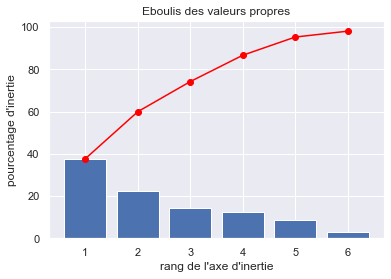

--------------------
Sur F1:
   sugars_100g : -0.05
   sodium _100g : -0.5
   energy_100g : -0.55
   fat_100g : -0.5
   fiber_100g : -0.24
   proteins_100g : -0.25
   SCORE : -0.3
Corrélation élevée entre les variables energy_100g, sodium _100g, fat_100g sur F1 .
--------------------
Sur F2:
   sugars_100g : -0.1
   sodium _100g : 0.13
   energy_100g : 0.15
   fat_100g : -0.05
   fiber_100g : 0.74
   proteins_100g : -0.3
   SCORE : -0.55
Corrélation élevée entre les variables proteins_100g, SCORE sur F2.
On observe que sugars_100g est une variable peux représentative.
--------------------
Sur F3:
   sugars_100g : 0.75
   sodium _100g : 0.25
   energy_100g : -0.05
   fat_100g : 0.15
   fiber_100g : -0.20
   proteins_100g : -0.6
   SCORE : -0.05
Corrélation entre les variables fat_100g, sodium _100g sur F3 .
On observe que energy_100g, SCORE sont des variables peux représentatives.
--------------------
Sur F4:
   sugars_100g : 0.65
   sodium _100g : -0.25
   energy_100g : 0.05
   fat_100

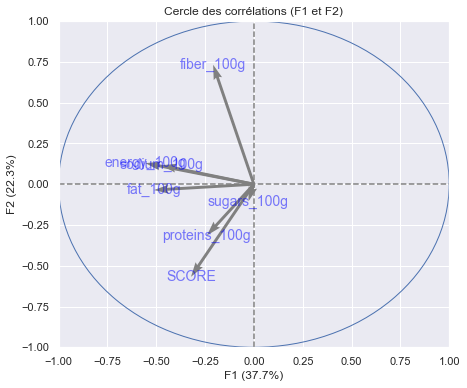

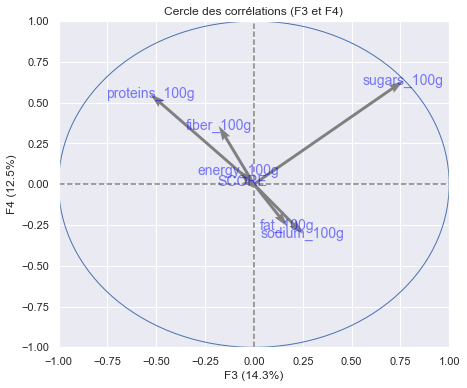

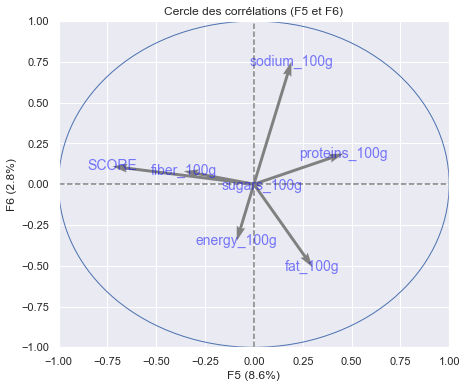

In [13]:
import pandas as pd
from sklearn import decomposition, preprocessing
from functions import *


# choix du nombre de composantes à calculer
n_comp = 6

# import de l'échantillon
#data = pd.read_csv("fr.openfoodfacts.org.products.csv", sep = '\t', low_memory=False)
#X = df.values

# préparation des données pour l'ACP
#data_pca = data_pca.fillna(data_pca.mean()) # Il est fréquent de remplacer les valeurs inconnues par la moyenne de la variable
#X = data_pca.values
names = df["energy_100g"] # ou data.index pour avoir les intitulés
features =  data_pca1.columns
#features = df.columns

# Centrage et Réduction
std_scale = preprocessing.StandardScaler().fit(X)
X_scaled = std_scale.transform(X)

# Réduire n'est ici pas nécessaire car les variables sont exprimées dans la même unité. 
# On se contente juste de centrer les données, ce qui est obligatoire pour une ACP.
X = preprocessing.StandardScaler(with_std=False).fit_transform(X)

# Calcul des composantes principales
pca1 = decomposition.PCA(n_components=n_comp)
pca1.fit(X_scaled)

# Eboulis des valeurs propres
display_scree_plot(pca1)

# Cercle des corrélations
print("-"*20)
print('Sur F1:')
print('   sugars_100g : -0.05')
print('   sodium _100g : -0.5')
print('   energy_100g : -0.55')
print('   fat_100g : -0.5')
print('   fiber_100g : -0.24')
print('   proteins_100g : -0.25')
print('   SCORE : -0.3')
print('Corrélation élevée entre les variables energy_100g, sodium _100g, fat_100g sur F1 .')
print("-"*20)
print('Sur F2:')
print('   sugars_100g : -0.1')
print('   sodium _100g : 0.13')
print('   energy_100g : 0.15')
print('   fat_100g : -0.05')
print('   fiber_100g : 0.74')
print('   proteins_100g : -0.3')
print('   SCORE : -0.55')
print('Corrélation élevée entre les variables proteins_100g, SCORE sur F2.') 
print('On observe que sugars_100g est une variable peux représentative.')
print("-"*20)
print('Sur F3:')
print('   sugars_100g : 0.75')
print('   sodium _100g : 0.25')
print('   energy_100g : -0.05')
print('   fat_100g : 0.15')
print('   fiber_100g : -0.20')
print('   proteins_100g : -0.6')
print('   SCORE : -0.05')
print('Corrélation entre les variables fat_100g, sodium _100g sur F3 .')
print('On observe que energy_100g, SCORE sont des variables peux représentatives.')
print("-"*20)
print('Sur F4:')
print('   sugars_100g : 0.65')
print('   sodium _100g : -0.25')
print('   energy_100g : 0.05')
print('   fat_100g : -0.25')
print('   fiber_100g : 0.3')
print('   proteins_100g : 0.6')
print('   SCORE : 0.05')
print('Corrélation élevée entre les variables sugars_100g, proteins_100g sur F4 .')
print('Corrélation élevée entre les variables fat_100g, sodium _100g sur F4 .')
print('Aucune corrélation entre les variables sugars_100g, proteins_100g  les deux flèches sont perpendiculaires.')  
print('Aucune corrélation entre les variables fat_100g, sugars_100g les deux flèches sont perpendiculaires.')  
print("-"*20)
print('Sur F5:')
print('   sugars_100g : 0.04')
print('   sodium _100g : 0.17')
print('   energy_100g : -0.10')
print('   fat_100g : 0.3')
print('   fiber_100g : -0.3')
print('   proteins_100g : 0.45')
print('   SCORE : -0.7')
print('Corrélation élevée entre les variables SCORE , fiber_100g  sur F5 .')  
print('On observe que sugars_100g est une variable peux représentative.')
print("-"*20)
print('Sur F6:')
print('   sugars_100g : -0.04')
print('   sodium _100g : 0.75')
print('   energy_100g : -0.3')
print('   fat_100g : -0.5')
print('   fiber_100g : 0.1')
print('   proteins_100g : 0.2')
print('   SCORE : 0.1')
print('Corrélation faible entre les variables energy_100g, fat_100g sur F6 .')
print('Corrélation faible entre les variables sodium _100g, proteins_100g sur F6 .')
print('Aucune corrélation entre les variables sodium _100g , SCORE les deux flèches sont perpendiculaires.')  
print('Aucune corrélation entre les variables energy_100g, SCORE les deux flèches sont perpendiculaires.')

pcs = pca.components_
display_circles(pcs, n_comp, pca1, [(0,1),(2,3),(4,5)], labels = np.array(features))


plt.show()

# Représentation d'une variable sous forme de graphique¶

Diagramme secteurs du nutri-score :
 Nous observons environ 34% des aliments sont catégorisés en b.
 Nous observons environ 23% des aliments sont catégorisés en d.
 Nous observons environ 18% des aliments sont catégorisés en c.
 Nous observons environ 15% des aliments sont catégorisés en e.
 Nous observons environ 13% des aliments sont catégorisés en a.


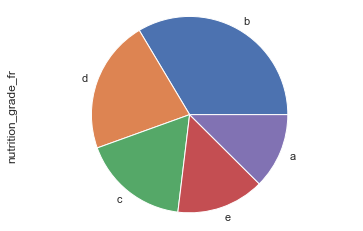

Diagramme en tuyaux d orgues du nutri-score :
 Nous observons environ 34% des aliments sont catégorisés en b.
 Nous observons environ 23% des aliments sont catégorisés en d.
 Nous observons environ 18% des aliments sont catégorisés en c.
 Nous observons environ 15% des aliments sont catégorisés en e.
 Nous observons environ 13% des aliments sont catégorisés en a.


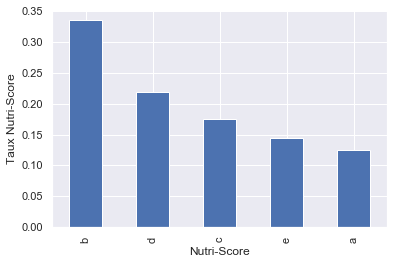

Histogramme du sucre : 
 Nous observons environ 130000 des aliments contiennent entre 0 g et 10 g de sucre.
 Nous observons environ 35000 des aliments contiennent entre 10 g et 20 g de sucre.
 Nous observons environ 20000 des aliments contiennent entre 20 g et 30 g de sucre.
 Nous observons environ 15000 des aliments contiennent entre 30 g et 40 g de sucre.
 Nous observons environ 10000 des aliments contiennent entre 40 g et 50 g de sucre.
 Nous observons environ 5000 des aliments contiennent entre 50 g et 60 g de sucre.
 Nous observons environ 2500 des aliments contiennent entre 60 g et 70 g de sucre.


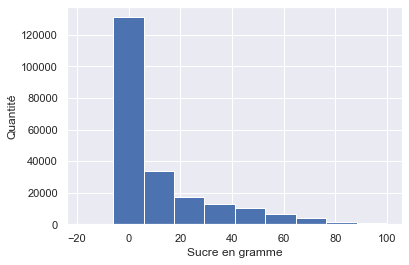

In [14]:
# VARIABLE QUALITATIVE
# Diagramme en secteurs
print('Diagramme secteurs du nutri-score :')
print(' Nous observons environ 34% des aliments sont catégorisés en b.')
print(' Nous observons environ 23% des aliments sont catégorisés en d.')
print(' Nous observons environ 18% des aliments sont catégorisés en c.')
print(' Nous observons environ 15% des aliments sont catégorisés en e.')
print(' Nous observons environ 13% des aliments sont catégorisés en a.')


df1 = df[df["nutrition_grade_fr"] != "none"]
df1["nutrition_grade_fr"].value_counts(normalize=True).plot(kind='pie')
# Cette ligne assure que le pie chart est un cercle plutôt qu'une éllipse
plt.axis('equal') 
plt.show() # Affiche le graphique

# Diagramme en tuyaux d'orgues
print('Diagramme en tuyaux d orgues du nutri-score :')
print(' Nous observons environ 34% des aliments sont catégorisés en b.')
print(' Nous observons environ 23% des aliments sont catégorisés en d.')
print(' Nous observons environ 18% des aliments sont catégorisés en c.')
print(' Nous observons environ 15% des aliments sont catégorisés en e.')
print(' Nous observons environ 13% des aliments sont catégorisés en a.')

plt.xlabel("Nutri-Score")
plt.ylabel("Taux Nutri-Score")
df1["nutrition_grade_fr"].value_counts(normalize=True).plot(kind='bar')
plt.show()

# VARIABLE QUANTITATIVE
# Histogramme
print('Histogramme du sucre : ')
print(' Nous observons environ 130000 des aliments contiennent entre 0 g et 10 g de sucre.')
print(' Nous observons environ 35000 des aliments contiennent entre 10 g et 20 g de sucre.')
print(' Nous observons environ 20000 des aliments contiennent entre 20 g et 30 g de sucre.')
print(' Nous observons environ 15000 des aliments contiennent entre 30 g et 40 g de sucre.')
print(' Nous observons environ 10000 des aliments contiennent entre 40 g et 50 g de sucre.')
print(' Nous observons environ 5000 des aliments contiennent entre 50 g et 60 g de sucre.')
print(' Nous observons environ 2500 des aliments contiennent entre 60 g et 70 g de sucre.')

plt.xlabel("Sucre en gramme")
plt.ylabel("Quantité")
df["sugars_100g"].hist()
plt.show()


# Mesures de tendance centrale, de dispersion et de forme¶

### Mesures de tendance centrale, de dispersion et de forme du nutri-score en fonction de l'énergie¶

--------------------
Pour la catégorie d :
   Histogramme en fonction nutri-score en fonction de l énergie pour la catégorie d.
  L asymétrie est à gauche presque symétrique. Les valeurs d asymétrie et d aplatissement entre -2 et +2
  sont considérées comme acceptables afin de prouver une distribution univariée normale pour l’analyse en fonction
  de l énergie.
   Boite à moustache distribution à gauche presque symétrique distribution presque égale, on en déduit que la corrélation est
  élevée entre l’énergie et la catégorie d du nutri-score.
--------------------
Pour la catégorie a :
   Histogramme en fonction nutri-score en fonction de l énergie pour la catégorie a. L asymétrie est à gauche. 
  Les valeurs d asymétrie et d aplatissement entre -2 et +2 sont considérées comme acceptables afin de prouver
  une distribution univariée normale pour l’analyse en fonction de l énergie.
   Boite à moustache distribution à gauche, on en déduit que la corrélation est élevée entre l énergie et l

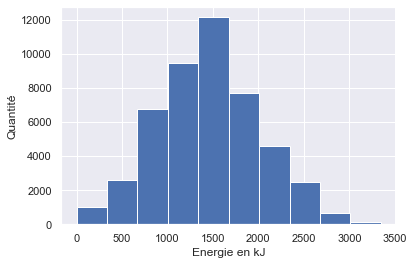

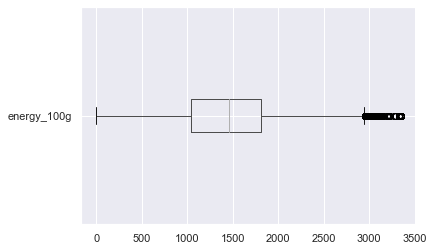

--------------------
a
moy:
 742.0515687624968
med:
 523.0
var:
 310879.0815448095
std:
 557.5653159449657
skw:
 0.5500894470605215
kur:
 -1.0990753347706887


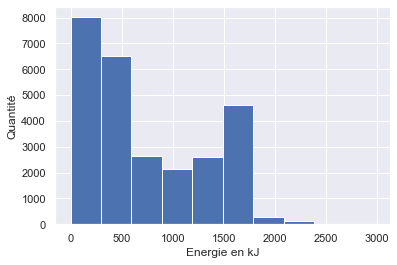

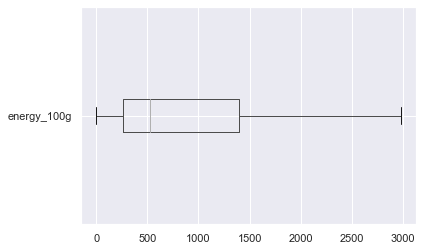

--------------------
c
moy:
 1001.1141333473163
med:
 858.0
var:
 449238.71525559056
std:
 670.2527249147075
skw:
 0.5983548336883269
kur:
 -0.4319596061766413


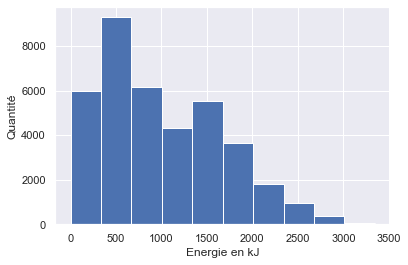

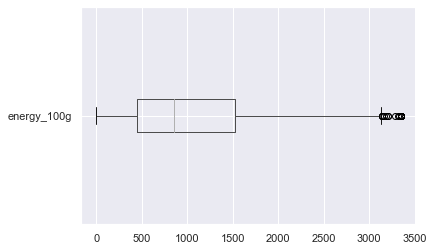

--------------------
b
moy:
 215.75383935191556
med:
 0.0
var:
 165052.71852167303
std:
 406.2668070636254
skw:
 2.6487562557532653
kur:
 7.712412618101086


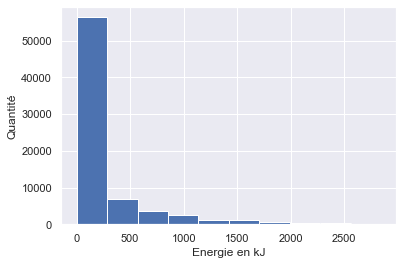

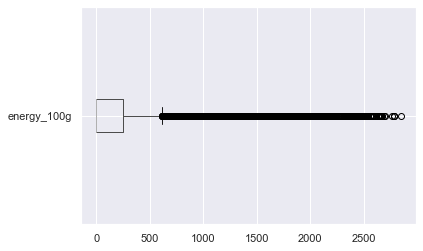

--------------------
e
moy:
 1844.1996093844625
med:
 1933.0
var:
 319206.20805486996
std:
 564.983369715313
skw:
 -0.6493841532254145
kur:
 1.6924772291564132


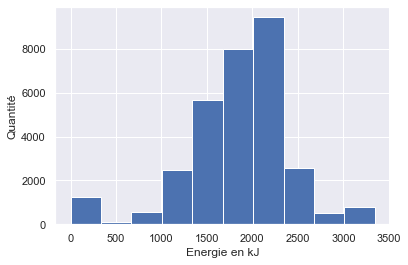

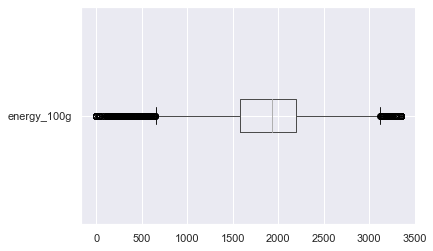

In [15]:
print("-"*20)

print('Pour la catégorie d :')
print('   Histogramme en fonction nutri-score en fonction de l énergie pour la catégorie d.') 
print('  L asymétrie est à gauche presque symétrique. Les valeurs d asymétrie et d aplatissement entre -2 et +2') 
print('  sont considérées comme acceptables afin de prouver une distribution univariée normale pour l’analyse en fonction')
print('  de l énergie.')
print('   Boite à moustache distribution à gauche presque symétrique distribution presque égale, on en déduit que la corrélation est') 
print('  élevée entre l’énergie et la catégorie d du nutri-score.') 
print("-"*20)

print('Pour la catégorie a :')
print('   Histogramme en fonction nutri-score en fonction de l énergie pour la catégorie a. L asymétrie est à gauche. ')
print('  Les valeurs d asymétrie et d aplatissement entre -2 et +2 sont considérées comme acceptables afin de prouver') 
print('  une distribution univariée normale pour l’analyse en fonction de l énergie.')
print('   Boite à moustache distribution à gauche, on en déduit que la corrélation est élevée entre l énergie et la') 
print('  catégorie a du nutri-score.') 
print("-"*20)

print('Pour la catégorie c :')
print('   Histogramme en fonction nutri-score en fonction de l énergie pour la catégorie c. L asymétrie est à gauche.')
print('  Les valeurs d asymétrie et d aplatissement entre -2 et +2 sont considérées comme acceptables afin de prouver')
print('  une distribution univariée normale pour l’analyse en fonction de l énergie.')
print('   Boite à moustache distribution à gauche, on en déduit que la corrélation est élevée entre l énergie et la ')
print('  catégorie c du nutri-score. ')
print("-"*20)

print('Pour la catégorie b :')
print('   Histogramme en fonction nutri-score en fonction de l énergie pour la catégorie b. L asymétrie est à gauche.')
print('  Les valeurs d asymétrie et d aplatissement ne sont pas entre -2 et +2 donc ne sont considérées pas comme acceptables afin') 
print('  de prouver une distribution univariée normale pour l’analyse en fonction de l énergie. On en déduit qu il n’a pas de') 
print('  corrélation entre l énergie et la catégorie b du nutri-score.') 
print('   Boite à moustache distribution à gauche.') 
print("-"*20)
      
print('Pour la catégorie e :')
print('   Histogramme en fonction nutri-score en fonction de l énergie pour la catégorie e. L asymétrie est à droite.') 
print('  Les valeurs d asymétrie et d aplatissement entre -2 et +2 sont considérées comme acceptables afin de prouver une') 
print('  distribution univariée normale pour l analyse en fonction de l énergie.')
print('   Boite à moustache distribution est à droite, on en déduit que la corrélation est élevée entre l énergie et la') 
print('  catégorie e du nutri-score.') 
print("-"*20)
      
for nut in df1["nutrition_grade_fr"].unique():
    sous_echantillon = df1[df1.nutrition_grade_fr == nut]
    print("-"*20)
    print(nut)
    print("moy:\n",sous_echantillon['energy_100g'].mean())
    print("med:\n",sous_echantillon['energy_100g'].median())
    print("var:\n",sous_echantillon['energy_100g'].var(ddof=0))
    print("std:\n",sous_echantillon['energy_100g'].std(ddof=0))
    print("skw:\n",sous_echantillon['energy_100g'].skew())
    print("kur:\n",sous_echantillon['energy_100g'].kurtosis())
    plt.xlabel("Energie en kJ")
    plt.ylabel("Quantité")
    sous_echantillon["energy_100g"].hist() # Crée l'histogramme
    plt.show() # Affiche l'histogramme
    sous_echantillon.boxplot(column="energy_100g", vert=False)
    plt.show()

In [16]:
import plotly.express as px

print("-"*20)

print('Pour la catégorie d :')
print('   Histogramme en fonction nutri-score en fonction de l énergie pour la catégorie d.') 
print('  L asymétrie est à gauche presque symétrique. Les valeurs d asymétrie et d aplatissement entre -2 et +2') 
print('  sont considérées comme acceptables afin de prouver une distribution univariée normale pour l’analyse en fonction')
print('  de l énergie.')

print("-"*20)

print('Pour la catégorie a :')
print('   Histogramme en fonction nutri-score en fonction de l énergie pour la catégorie a. L asymétrie est à gauche. ')
print('  Les valeurs d asymétrie et d aplatissement entre -2 et +2 sont considérées comme acceptables afin de prouver') 
print('  une distribution univariée normale pour l’analyse en fonction de l énergie.')

print("-"*20)

print('Pour la catégorie c :')
print('   Histogramme en fonction nutri-score en fonction de l énergie pour la catégorie c. L asymétrie est à gauche.')
print('  Les valeurs d asymétrie et d aplatissement entre -2 et +2 sont considérées comme acceptables afin de prouver')
print('  une distribution univariée normale pour l’analyse en fonction de l énergie.')

print("-"*20)

print('Pour la catégorie b :')
print('   Histogramme en fonction nutri-score en fonction de l énergie pour la catégorie b. L asymétrie est à gauche.')
print('  Les valeurs d asymétrie et d aplatissement ne sont pas entre -2 et +2 donc ne sont considérées pas comme acceptables afin') 
print('  de prouver une distribution univariée normale pour l’analyse en fonction de l énergie. On en déduit qu il n’a pas de') 
 
print("-"*20)
      
print('Pour la catégorie e :')
print('   Histogramme en fonction nutri-score en fonction de l énergie pour la catégorie e. L asymétrie est à droite.') 
print('  Les valeurs d asymétrie et d aplatissement entre -2 et +2 sont considérées comme acceptables afin de prouver une') 
print('  distribution univariée normale pour l analyse en fonction de l énergie.')
 
print("-"*20)
      
for nut in df1["nutrition_grade_fr"].unique():
    sous_echantillon = df1[df1.nutrition_grade_fr == nut]
    print("-"*20)
    print(nut)
    print("moy:\n",sous_echantillon['energy_100g'].mean())
    print("med:\n",sous_echantillon['energy_100g'].median())
    print("var:\n",sous_echantillon['energy_100g'].var(ddof=0))
    print("std:\n",sous_echantillon['energy_100g'].std(ddof=0))
    print("skw:\n",sous_echantillon['energy_100g'].skew())
    print("kur:\n",sous_echantillon['energy_100g'].kurtosis())
    #plt.xlabel("Energie en kJ")
    #plt.ylabel("Quantité")
    #sous_echantillon["energy_100g"].hist() # Crée l'histogramme
    #plt.show() # Affiche l'histogramme
    #sous_echantillon.boxplot(column="energy_100g", vert=False)
    #plt.show()dfa = px.data.tips()
    fig = px.histogram(sous_echantillon["energy_100g"], x="energy_100g")
    fig.show()
    

--------------------
Pour la catégorie d :
   Histogramme en fonction nutri-score en fonction de l énergie pour la catégorie d.
  L asymétrie est à gauche presque symétrique. Les valeurs d asymétrie et d aplatissement entre -2 et +2
  sont considérées comme acceptables afin de prouver une distribution univariée normale pour l’analyse en fonction
  de l énergie.
--------------------
Pour la catégorie a :
   Histogramme en fonction nutri-score en fonction de l énergie pour la catégorie a. L asymétrie est à gauche. 
  Les valeurs d asymétrie et d aplatissement entre -2 et +2 sont considérées comme acceptables afin de prouver
  une distribution univariée normale pour l’analyse en fonction de l énergie.
--------------------
Pour la catégorie c :
   Histogramme en fonction nutri-score en fonction de l énergie pour la catégorie c. L asymétrie est à gauche.
  Les valeurs d asymétrie et d aplatissement entre -2 et +2 sont considérées comme acceptables afin de prouver
  une distribution univarié

--------------------
a
moy:
 742.0515687624968
med:
 523.0
var:
 310879.0815448095
std:
 557.5653159449657
skw:
 0.5500894470605215
kur:
 -1.0990753347706887


--------------------
c
moy:
 1001.1141333473163
med:
 858.0
var:
 449238.71525559056
std:
 670.2527249147075
skw:
 0.5983548336883269
kur:
 -0.4319596061766413


--------------------
b
moy:
 215.75383935191556
med:
 0.0
var:
 165052.71852167303
std:
 406.2668070636254
skw:
 2.6487562557532653
kur:
 7.712412618101086


--------------------
e
moy:
 1844.1996093844625
med:
 1933.0
var:
 319206.20805486996
std:
 564.983369715313
skw:
 -0.6493841532254145
kur:
 1.6924772291564132


# Analyse bivariée : 2 variables quanti

In [17]:
import numpy as np

### Analyse bivariée : Energie en fonction du sucre

Nous observons qu’il y a corrélation entre énergie et sucre.


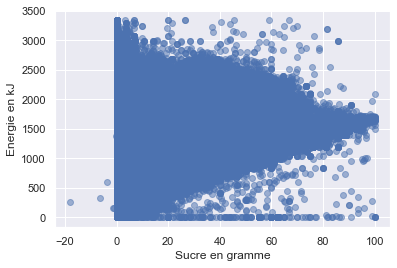

In [18]:
print('Nous observons qu’il y a corrélation entre énergie et sucre.')
plt.plot(df["sugars_100g"],df["energy_100g"],'o',alpha=0.5)
plt.xlabel("Sucre en gramme")
plt.ylabel("Energie en kJ")
plt.show()

### Analyse bivariée : Energie en fonction de la matière grasse

Nous observons qu’il y a corrélation entre énergie et matière grasse.


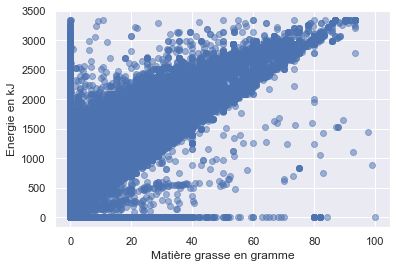

In [19]:
print('Nous observons qu’il y a corrélation entre énergie et matière grasse.')
plt.plot(df["fat_100g"],df["energy_100g"],'o',alpha=0.5)
plt.xlabel("Matière grasse en gramme")
plt.ylabel("Energie en kJ")
plt.show()

### Analyse bivariée : Energie en fonction de fibre

Nous observons qu’il y a une faible corrélation entre énergie et fibre.


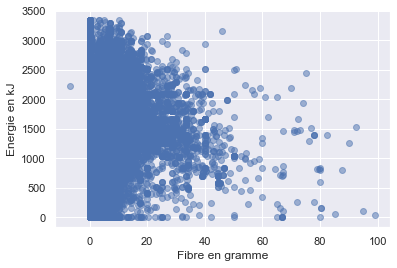

In [20]:
print('Nous observons qu’il y a une faible corrélation entre énergie et fibre.')
plt.plot(df["fiber_100g"],df["energy_100g"],'o',alpha=0.5)
plt.xlabel("Fibre en gramme")
plt.ylabel("Energie en kJ")
plt.show()

### Analyse bivariée : Matiere grasse en fonction de graisse saturee

Nous observons qu’il y a corrélation entre matière grasse et graisse saturée.


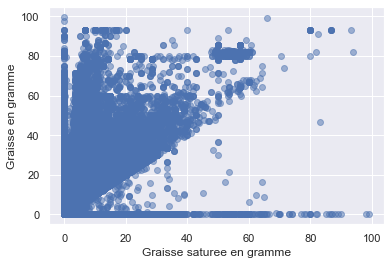

In [21]:
print('Nous observons qu’il y a corrélation entre matière grasse et graisse saturée.')
plt.plot(df["saturated-fat_100g"],df["fat_100g"],'o',alpha=0.5)
plt.xlabel("Graisse saturee en gramme")
plt.ylabel("Graisse en gramme")
plt.show()

# Analyse bivariée : 1 variable quanti et 1 quali

### Analyse bivariée : Energie en fonction du nutri-score

In [22]:
X = "nutrition_grade_fr" # qualitative
Y = "energy_100g" # quantitative
#sous echantillon energie
sous_echantillon1 = df[df["energy_100g"] < 3350].copy()

# On étudie le nutri-score:
sous_echantillon1 = sous_echantillon1[sous_echantillon1["nutrition_grade_fr"] != "none"] 

In [23]:
# Changement de la palette graphique
sns.set_palette(sns.color_palette("colorblind", 3))

In [24]:
import plotly.express as px
import pandas as pd
modalites = sous_echantillon1[X].unique()
groupes = []
print('Nous observons que la catégorie e est la catégorie la plus élevé en énergie .')
print('Nous constatons également  que les catégories a , d , c sont beaucoup plus dispersées et plus élevées en énergie que la catégorie b.')
modalites = ['a', 'b', 'c', 'd', 'e']
for m in modalites:
    #groupes.append(sous_echantillon1[sous_echantillon1[X]==m][Y])
    echantillon1 = sous_echantillon1[sous_echantillon1[X]==m][Y]

    
    
    fig = px.box(echantillon1,  y = "energy_100g"  , title = m )

    fig.show()


Nous observons que la catégorie e est la catégorie la plus élevé en énergie .
Nous constatons également  que les catégories a , d , c sont beaucoup plus dispersées et plus élevées en énergie que la catégorie b.


Nous observons que la catégorie e est la catégorie la plus élevé en énergie .
Nous constatons également  que les catégories a , d , c sont beaucoup plus dispersées et plus élevées en énergie que la catégorie b.


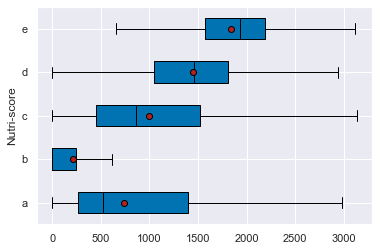

In [25]:
modalites = sous_echantillon1[X].unique()
groupes = []
print('Nous observons que la catégorie e est la catégorie la plus élevé en énergie .')
print('Nous constatons également  que les catégories a , d , c sont beaucoup plus dispersées et plus élevées en énergie que la catégorie b.')

modalites = ['a', 'b', 'c', 'd', 'e']
for m in modalites:
    groupes.append(sous_echantillon1[sous_echantillon1[X]==m][Y])
    
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
plt.ylabel("Nutri-score")    
plt.boxplot(groupes, labels=modalites, showfliers=False, medianprops=medianprops, vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)

plt.show()

### Analyse bivariée : Sucre en fonction du nutri-score

In [26]:
X = "nutrition_grade_fr" # qualitative
Y = "sugars_100g" # quantitative
#sous echantillon sucre
sous_echantillon2 = df[df["sugars_100g"] < 100].copy()

# On étudie le nutri-score:
sous_echantillon2 = sous_echantillon2[sous_echantillon2["nutrition_grade_fr"] != "none"] 

In [27]:
# Changement de la palette graphique
sns.set_palette(sns.color_palette("colorblind", 3))

Nous constatons que les catégories c , d , e sont beaucoup plus dispersées et plus élevées  en sucre que les catégories b et c.


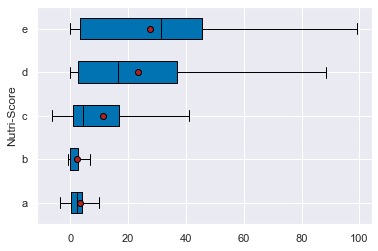

In [28]:
modalites = sous_echantillon2[X].unique()
groupes = []

print('Nous constatons que les catégories c , d , e sont beaucoup plus dispersées et plus élevées  en sucre que les catégories b et c.')
modalites = ['a', 'b', 'c', 'd', 'e']
for m in modalites:
    groupes.append(sous_echantillon2[sous_echantillon2[X]==m][Y])
    
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
plt.ylabel("Nutri-Score") 
plt.boxplot(groupes, labels=modalites, showfliers=False, medianprops=medianprops, vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.show()

### Analyse bivariée : Energie en fonction du pnns groups 1

In [29]:
X = "pnns_groups_1" # qualitative
Y = "energy_100g" # quantitative
#sous echantillon energie
sous_echantillon3 = df[df["energy_100g"] < 500].copy()

# On étudie le pnns gp1:
sous_echantillon3 = sous_echantillon3[sous_echantillon3["pnns_groups_1"] != "none"] 

In [30]:
# Changement de la palette graphique
sns.set_palette(sns.color_palette("colorblind", 3))

In [31]:
import plotly.express as px
import pandas as pd
modalites = sous_echantillon3[X].unique()
groupes = []
print('Nous constatons également que les catégories cereals and potatoes  ,  beverages, fruits and vegetables ,') 
print('fat ans sauces, composite foods , milk and dairy products ,fish meat eggs sont beaucoup plus ')
print('dispersées et plus élevées en énergie que les catégories sugary snacks , salty snacks et sugary snack.')
for m in modalites:
    #groupes.append(sous_echantillon1[sous_echantillon1[X]==m][Y])
    echantillon3 = sous_echantillon3[sous_echantillon3[X]==m][Y]

    
    
    fig = px.box(echantillon3,  y = "energy_100g"  , title = m )

    fig.show()


Nous constatons également que les catégories cereals and potatoes  ,  beverages, fruits and vegetables ,
fat ans sauces, composite foods , milk and dairy products ,fish meat eggs sont beaucoup plus 
dispersées et plus élevées en énergie que les catégories sugary snacks , salty snacks et sugary snack.


Nous constatons également que les catégories cereals and potatoes  ,  beverages, fruits and vegetables ,
fat ans sauces, composite foods , milk and dairy products ,fish meat eggs sont beaucoup plus 
dispersées et plus élevées en énergie que les catégories sugary snacks , salty snacks et sugary snack.


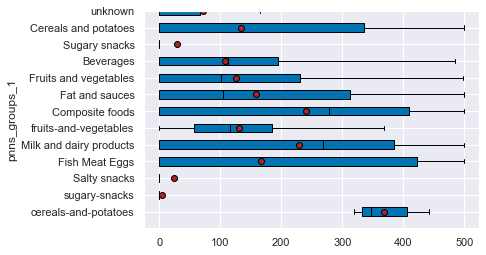

In [32]:
modalites = sous_echantillon3[X].unique()
groupes = []

print('Nous constatons également que les catégories cereals and potatoes  ,  beverages, fruits and vegetables ,') 
print('fat ans sauces, composite foods , milk and dairy products ,fish meat eggs sont beaucoup plus ')
print('dispersées et plus élevées en énergie que les catégories sugary snacks , salty snacks et sugary snack.')
for m in modalites:
    groupes.append(sous_echantillon3[sous_echantillon3[X]==m][Y])
    
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
plt.ylabel("pnns_groups_1")    

plt.ylim(14, 1)


plt.boxplot(groupes, labels=modalites, showfliers=False, medianprops=medianprops, vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.show()

### Analyse bivariée : Sucre en fonction du pnns groups 1

In [33]:
X = "pnns_groups_1" # qualitative
Y = "sugars_100g" # quantitative
#sous echantillon sucre
sous_echantillon5 = df[df["sugars_100g"] < 100].copy()

# On étudie le pnns gp1:
sous_echantillon = sous_echantillon5[sous_echantillon5["pnns_groups_1"] != "none"] 

In [34]:
# Changement de la palette graphique
sns.set_palette(sns.color_palette("colorblind", 3))

Nous constatons également que la catégorie  sugary snacks  est beaucoup plus
dispersée et plus élevée en sucre que les catégories cereals and potatoes,
beverages, fruits and vegetables , fat ans sauces, composite foods , 
milk and dairy products ,fish meat eggs, salty snacks et sugary snack.


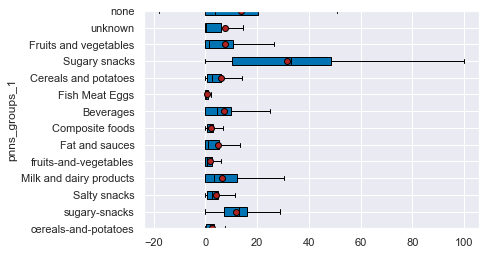

In [35]:
modalites = sous_echantillon5[X].unique()
groupes = []
print('Nous constatons également que la catégorie  sugary snacks  est beaucoup plus') 
print('dispersée et plus élevée en sucre que les catégories cereals and potatoes,')  
print('beverages, fruits and vegetables , fat ans sauces, composite foods , ')
print('milk and dairy products ,fish meat eggs, salty snacks et sugary snack.')



for m in modalites:
    groupes.append(sous_echantillon5[sous_echantillon5[X]==m][Y])
    
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
plt.ylabel("pnns_groups_1")    

plt.ylim(14, 1)

plt.boxplot(groupes, labels=modalites, showfliers=False, medianprops=medianprops, vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
plt.show()

# ANOVA

### ANOVA : Energie fonction du nutri-score

In [36]:
X = "nutrition_grade_fr" # qualitative
Y = "energy_100g" # quantitative

# Sous echantillon energie
sous_echantillon1 = df[df["energy_100g"] <3350]

def eta_squared(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT
print('La valeur est de 0.55 donc il y a corrélation entre l’énergie et le nutri-score.')    
eta_squared(sous_echantillon1[X],sous_echantillon1[Y])


La valeur est de 0.55 donc il y a corrélation entre l’énergie et le nutri-score.


0.5506288544696435

### ANOVA : Sucre fonction du nutri-score

In [37]:
X = "nutrition_grade_fr" # qualitative
Y = "sugars_100g" # quantitative

# Sous echantillon sucre
sous_echantillon2 = df[df["sugars_100g"] < 100]

def eta_squared(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT
print('La valeur est de 0.29 donc il y a une faible corrélation entre le sucre et le nutri-score.')    
eta_squared(sous_echantillon2[X],sous_echantillon2[Y])


La valeur est de 0.29 donc il y a une faible corrélation entre le sucre et le nutri-score.


0.2921158884978553

### ANOVA : Energie fonction du pnns groups 1

In [38]:
X = "pnns_groups_1" # qualitative
Y = "energy_100g" # quantitative

# Sous echantillon energie
sous_echantillon3 = df[df["energy_100g"] < 100]

def eta_squared(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT
print('La valeur est de 0.039 proche de zéro donc il n’y a pas de corrélation entre l’énergie et le pnns grp 1.')
eta_squared(sous_echantillon3[X],sous_echantillon3[Y])

La valeur est de 0.039 proche de zéro donc il n’y a pas de corrélation entre l’énergie et le pnns grp 1.


0.03918794767173204

### ANOVA : Energie fonction du pnns groups 2

In [39]:
X = "pnns_groups_2" # qualitative
Y = "energy_100g" # quantitative

# Sous echantillon energie
sous_echantillon4 = df[df["energy_100g"] < 100]

def eta_squared(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT
print('La valeur est de 0.068 proche de zéro donc il n’y a pas de corrélation entre l’énergie et le pnns grp 2.')    
eta_squared(sous_echantillon4[X],sous_echantillon4[Y])

La valeur est de 0.068 proche de zéro donc il n’y a pas de corrélation entre l’énergie et le pnns grp 2.


0.06826123908753806

### ANOVA : Sucre fonction du pnns groups 1

In [40]:
X = "pnns_groups_1" # qualitative
Y = "sugars_100g" # quantitative

# Sous echantillon sucre
sous_echantillon5 = df[df["sugars_100g"] < 100]

def eta_squared(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT
print('La valeur est de 0.089 proche de zéro donc il n’y a pas de corrélation entre le sucre et le pnns grp 1.')    
eta_squared(sous_echantillon5[X],sous_echantillon5[Y])

La valeur est de 0.089 proche de zéro donc il n’y a pas de corrélation entre le sucre et le pnns grp 1.


0.08964816561119977

### ANOVA : Sucre fonction du pnns groups 2

In [41]:
X = "pnns_groups_2" # qualitative
Y = "sugars_100g" # quantitative

# Sous echantillon sucre
sous_echantillon6 = df[df["sugars_100g"] < 100]

def eta_squared(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT
print('La valeur est de 0.1 proche de zéro donc il n’y a pas de corrélation entre le sucre et le pnns grp 2.')    
eta_squared(sous_echantillon6[X],sous_echantillon6[Y])

La valeur est de 0.1 proche de zéro donc il n’y a pas de corrélation entre le sucre et le pnns grp 2.


0.10959281113177605

### ANOVA : fer fonction du nutri-score

In [42]:
X = "nutrition_grade_fr" # qualitative
Y = "iron_100g" # quantitative

# Sous echantillon energie
sous_echantillon1 = df[df["iron_100g"] <100]

def eta_squared(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT
print('La valeur est de 9.458e-05 proche de zéro donc il n’y a pas de corrélation entre le fer et et le nutri-score.')    
eta_squared(sous_echantillon1[X],sous_echantillon1[Y])

La valeur est de 9.458e-05 proche de zéro donc il n’y a pas de corrélation entre le fer et et le nutri-score.


9.458870769154627e-05

### ANOVA : fer fonction du pnns groups 1

In [43]:
X = "pnns_groups_1" # qualitative
Y = "iron_100g" # quantitative

# Sous echantillon sucre
sous_echantillon5 = df[df["iron_100g"] < 100]

def eta_squared(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT
print('La valeur est de 0.00019 proche de zéro donc il n’y a pas de corrélation entre le fer et le pnns grp 1.')    
eta_squared(sous_echantillon5[X],sous_echantillon5[Y])

La valeur est de 0.00019 proche de zéro donc il n’y a pas de corrélation entre le fer et le pnns grp 1.


0.00019594326796834122

### ANOVA : fer fonction du pnns groups 2

In [44]:
X = "pnns_groups_2" # qualitative
Y = "iron_100g" # quantitative

# Sous echantillon sucre
sous_echantillon5 = df[df["iron_100g"] < 100]

def eta_squared(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT
print('La valeur est de 0.00029 proche de zéro donc il n’y a pas de corrélation entre le fer et le pnns grp 2.')    
eta_squared(sous_echantillon5[X],sous_echantillon5[Y])

La valeur est de 0.00029 proche de zéro donc il n’y a pas de corrélation entre le fer et le pnns grp 2.


0.00029149399603358415